# Suo

- Training v01_01:
    - integration_library_platform_coarse
    - integration_donor
    - organ

- Training v01_02:
    - __(covariate)__ integration_library_platform_coarse
    - __(covariate)__ integration_donor
    - organ

- Training v01_03:
    - __(covariate)__ integration_library_platform_coarse
    - integration_donor
    - organ
 
- Training v01_04:
    - integration_library_platform_coarse
    - __(covariate)__ integration_donor
    - organ
 
- Training v01_05:
    - __(covariate)__ covariate integration_library_platform_coarse
    - __(covariate)__ covariate integration_donor
    - __(covariate)__ organ

- Training v02_01:
    - integration_library_platform_coarse
    - __(covariate)__ integration_donor

- Training v02_02:
    - integration_library_platform_coarse
    - integration_donor

- Training v02_03:
    - __(covariate)__ integration_library_platform_coarse
    - integration_donor

- Training v02_04:
    - __(covariate)__ integration_library_platform_coarse
    - __(covariate)__ integration_donor

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)

In [6]:
!ls /home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo* | grep -v 'latent_subset' | grep -v '_scib_'

/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_scvi_15_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_scvi_30_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_encode_tardis_15_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_encode_tardis_30_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis_15_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis_30_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_02_2_encode_tardis_15_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_02_2_encode_tardis_30_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_02_2_tardis_15_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_da

In [26]:
!ls /home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis* | grep -v '_scib_'

/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis_15_latent.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis_15_latent_subset-integration_donor.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis_15_latent_subset-integration_donor-integration_library_platform_coarse.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis_15_latent_subset-integration_donor-integration_library_platform_coarse-organ.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis_15_latent_subset-integration_donor-integration_library_platform_coarse-unreserved.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis_15_latent_subset-integration_donor-organ.h5ad
/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent/suo_v01_01_2_tardis_15_latent_subset-integra

In [8]:
model_name = "suo_v01_01_2"
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    model_name
)
vae = tardis.MyModel.load(dir_path=dir_path, adata=adata)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
  rank_zero_warn(


INFO     File /lustre/groups/ml01/workspace/kemal.inecik/tardis_data/models/suo_v01_01_2/model.pt already          
         downloaded                                                                                                


In [9]:
_latent = ad.read_h5ad(os.path.join("/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent", 
                                    f"{model_name}_tardis_30_latent.h5ad"))
_latent.obs["validation"] = "train"
_latent.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1691466/906139524.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _latent.obs["validation"].iloc[vae.validation_indices] = "validation"


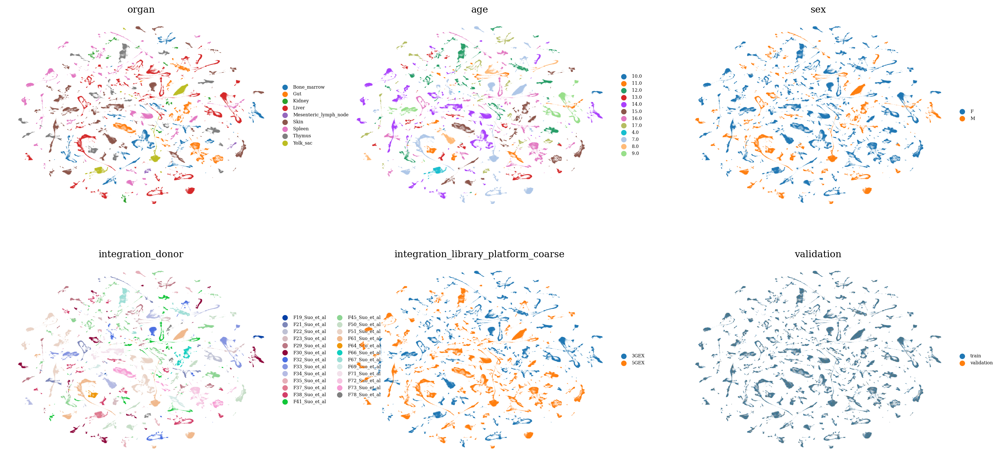

In [10]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        _latent, 
        color=['organ', 'age', 'sex', 'integration_donor', 'integration_library_platform_coarse', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [11]:
_latent = ad.read_h5ad(os.path.join("/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent", 
                                    f"{model_name}_tardis_30_latent_subset-integration_library_platform_coarse.h5ad"))
_latent.obs["validation"] = "train"
_latent.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1691466/638289385.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _latent.obs["validation"].iloc[vae.validation_indices] = "validation"


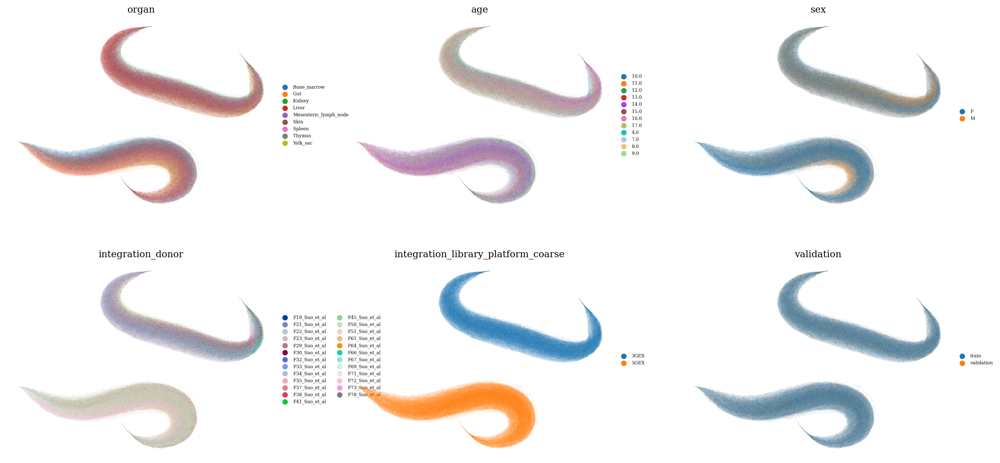

In [12]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        _latent, 
        color=['organ', 'age', 'sex', 'integration_donor', 'integration_library_platform_coarse', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [13]:
_latent = ad.read_h5ad(os.path.join("/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent", 
                                    f"{model_name}_tardis_30_latent_subset-unreserved.h5ad"))
_latent.obs["validation"] = "train"
_latent.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1691466/3607321964.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _latent.obs["validation"].iloc[vae.validation_indices] = "validation"


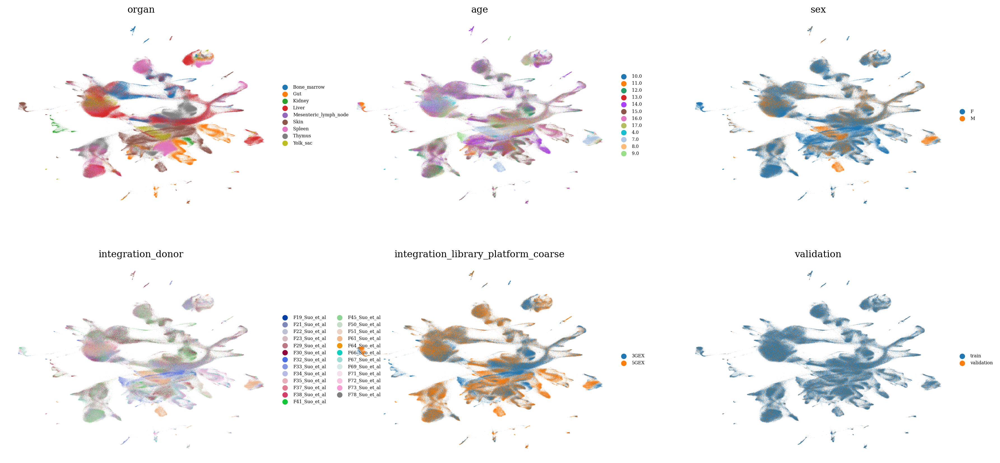

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        _latent, 
        color=['organ', 'age', 'sex', 'integration_donor', 'integration_library_platform_coarse', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [17]:
_latent = ad.read_h5ad(os.path.join("/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent", 
                                    f"{model_name}_tardis_30_latent_subset-organ.h5ad"))
_latent.obs["validation"] = "train"
_latent.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1691466/993737375.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _latent.obs["validation"].iloc[vae.validation_indices] = "validation"


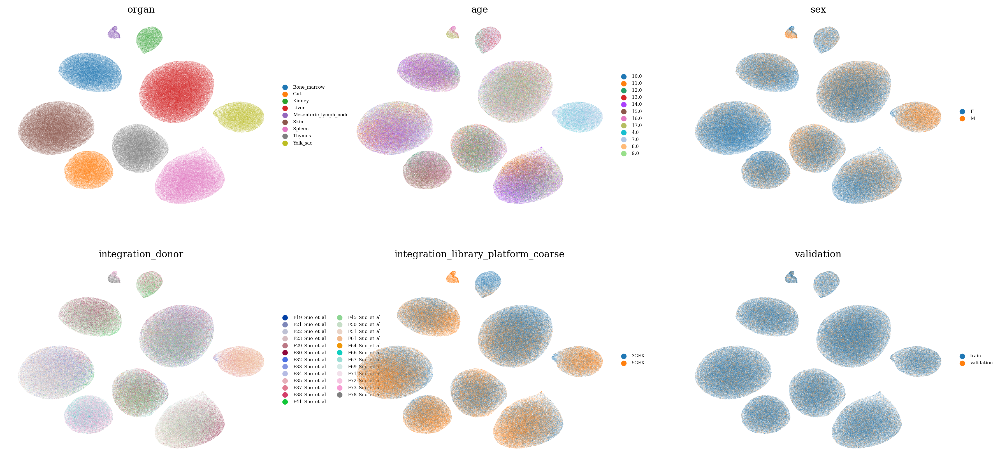

In [18]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        _latent, 
        color=['organ', 'age', 'sex', 'integration_donor', 'integration_library_platform_coarse', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [19]:
_latent = ad.read_h5ad(os.path.join("/home/icb/kemal.inecik/lustre_workspace/tardis_data/_temporary/latent", 
                                    f"{model_name}_tardis_30_latent_subset-integration_donor.h5ad"))
_latent.obs["validation"] = "train"
_latent.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1691466/2612606755.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _latent.obs["validation"].iloc[vae.validation_indices] = "validation"


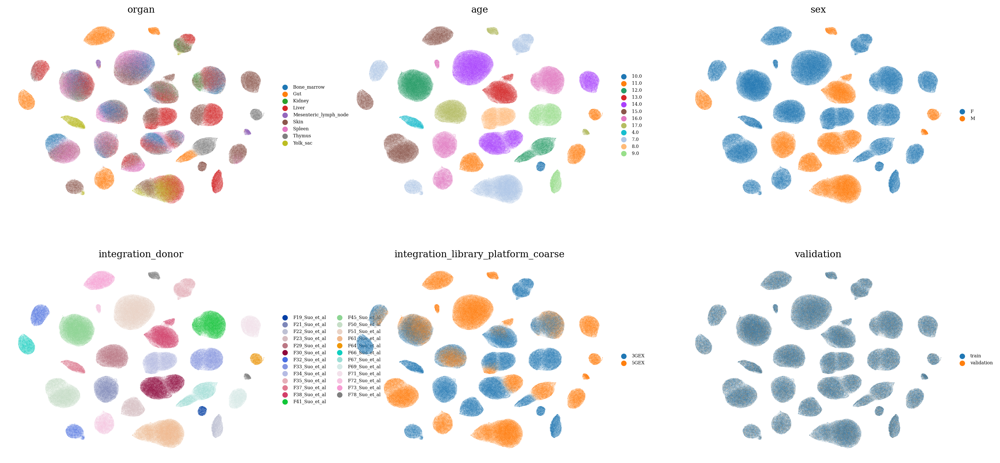

In [20]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        _latent, 
        color=['organ', 'age', 'sex', 'integration_donor', 'integration_library_platform_coarse', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [51]:
df_a = pd.concat([pd.read_pickle("/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/_temporary/latent/suo_scvi_30_latent_scib_bioconservation.pickle"), 
           pd.read_pickle("/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/_temporary/latent/suo_scvi_15_latent_scib_batchcorrection.pickle")], axis=1).T
for l in ["01_01", "01_02", "01_03", "01_04", "01_05", "02_01", "02_02", "02_03", "02_04"]:
    df_b = pd.concat([pd.read_pickle(f"/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/_temporary/latent/suo_v{l}_2_tardis_30_latent_scib_bioconservation.pickle"), 
           pd.read_pickle(f"/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/_temporary/latent/suo_v{l}_2_tardis_15_latent_scib_batchcorrection.pickle")], axis=1).T

    df_a[f"tardis_{l}"] = df_b.loc[df_a.index, "tardis"]

In [52]:
df_a

Embedding,X_pca,harmony,scvi,Metric Type,tardis_01_01,tardis_01_02,tardis_01_03,tardis_01_04,tardis_01_05,tardis_02_01,tardis_02_02,tardis_02_03,tardis_02_04
isolated_labels,0.610272,0.563059,0.638389,Bio conservation,0.661863,0.666479,0.721211,0.657608,0.650838,0.632303,0.766766,0.726439,0.668565
nmi_ari_cluster_labels_kmeans_nmi,0.690709,0.62006,0.648662,Bio conservation,0.633962,0.61507,0.619616,0.628516,0.611521,0.687758,0.713115,0.713977,0.696774
nmi_ari_cluster_labels_kmeans_ari,0.226331,0.181996,0.20866,Bio conservation,0.184607,0.176319,0.177248,0.191146,0.180273,0.212614,0.227751,0.233411,0.224088
silhouette_label,0.503657,0.481865,0.496089,Bio conservation,0.496587,0.49586,0.494441,0.495296,0.497069,0.503901,0.50828,0.508304,0.50575
clisi_knn,0.998818,0.997089,0.998886,Bio conservation,0.997906,0.997466,0.99786,0.997659,0.996414,0.998903,0.999242,0.99919,0.998856
Bio conservation,0.605958,0.568814,0.598137,Aggregate score,0.594985,0.590239,0.602075,0.594045,0.587223,0.607096,0.643031,0.636264,0.618807
silhouette_batch,0.850927,0.86237,0.866727,Batch correction,0.902978,0.91098,0.903682,0.909787,0.914006,0.900252,0.895995,0.897158,0.905384
ilisi_knn,0.056555,0.099565,0.097533,Batch correction,0.093512,0.104338,0.094405,0.102078,0.110661,0.092117,0.079706,0.079108,0.089874
kbet_per_label,0.308528,0.474564,0.487069,Batch correction,0.448412,0.479616,0.441286,0.461823,0.493116,0.454354,0.43022,0.432159,0.451186
graph_connectivity,0.793244,0.67147,0.865588,Batch correction,0.866077,0.86366,0.864619,0.870198,0.846773,0.877681,0.878848,0.879514,0.869526


In [ ]:
pd.concat([pd.read_pickle("/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/_temporary/latent/suo_scvi_30_latent_scib_bioconservation.pickle"), 
           pd.read_pickle("/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/_temporary/latent/suo_scvi_15_latent_scib_batchcorrection.pickle")], axis=1)